# NAIP imagery demo

The National Agriculture Imagery Program (NAIP) acquires aerial imagery during the agricultural growing seasons in the continental U.S.

NAIP projects are contracted each year based upon available funding and the FSA imagery acquisition cycle. Beginning in 2003, NAIP was acquired on a 5-year cycle. 2008 was a transition year, and a three-year cycle began in 2009.

NAIP imagery is acquired at a one-meter ground sample distance (GSD) with a horizontal accuracy that matches within six meters of photo-identifiable ground control points, which are used during image inspection.

Older images were collected using 3 bands (Red, Green, and Blue: RGB), but newer imagery is usually collected with an additional near-infrared band (RGBN). RGB asset ids begin with 'n', NRG asset ids begin with 'c', RGBN asset ids begin with 'm_'.

For this demo, data was provided by the US Forest service. Data is not available for download due to permissions.
To prepare for this demo, a portion of the NAIP tile was cropped and the NIR band was dropped. DeepForest currently works only on 3 band imges, though it is concievable, and interesting, to retrain on RGBN bands in the future.

In [44]:
import matplotlib.pyplot as plt
from deepforest import deepforest
from deepforest import preprocess
from PIL import Image
import cv2
import numpy as np

Let's begin by looking at the pretrained model. One key question is the window size for prediction. Since geospatial tiles are often very large, DeepForest cuts them into overlapping windows, makes a prediction on each windows and reassembles them. Choosing a window size is important. Since the pretrained model was trained on 0.1m data with 400m windows, and the NAIP imagery is ~0.35m, we will try 150px windows (400/3.5=115px).

In [2]:
test_model = deepforest.deepforest()
test_model.use_release()

#predict image
raster_path = "/Users/ben/Downloads/NAIP/East_ben.tif"
raster = Image.open(raster_path)
numpy_image = np.array(raster)
numpy_image.shape

Reading config file: /Users/ben/Documents/DeepForest_French_Guiana/DeepForest/lib/python3.7/site-packages/deepforest/data/deepforest_config.yml
A blank deepforest object created. To perform prediction, either train or load an existing model.
Model from DeepForest release https://github.com/weecology/DeepForest/releases/tag/v0.2.1 was already downloaded. Loading model from file.
Loading pre-built model: https://github.com/weecology/DeepForest/releases/tag/v0.2.1

tracking <tf.Variable 'Variable:0' shape=(9, 4) dtype=float32> anchors
tracking <tf.Variable 'Variable_1:0' shape=(9, 4) dtype=float32> anchors
tracking <tf.Variable 'Variable_2:0' shape=(9, 4) dtype=float32> anchors
tracking <tf.Variable 'Variable_3:0' shape=(9, 4) dtype=float32> anchors
tracking <tf.Variable 'Variable_4:0' shape=(9, 4) dtype=float32> anchors
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


/Users/ben/Documents/DeepForest_French_Guiana/DeepForest/lib/python3.7/site-packages/PIL/Image.py:2731: DecompressionBombWarning: Image size (112167750 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  DecompressionBombWarning,


(10410, 10775, 3)

These warnings are common and can be ignored.

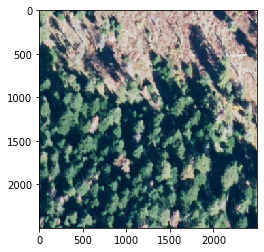

In [40]:
windows = preprocess.compute_windows(numpy_image, patch_size=2500,patch_overlap=0.1)
index = 21
crop = numpy_image[windows[index].indices()] 
crop.shape
plt.imshow(crop)
crop = crop[...,::-1] #keras-retinanet requires bluegreered channel order

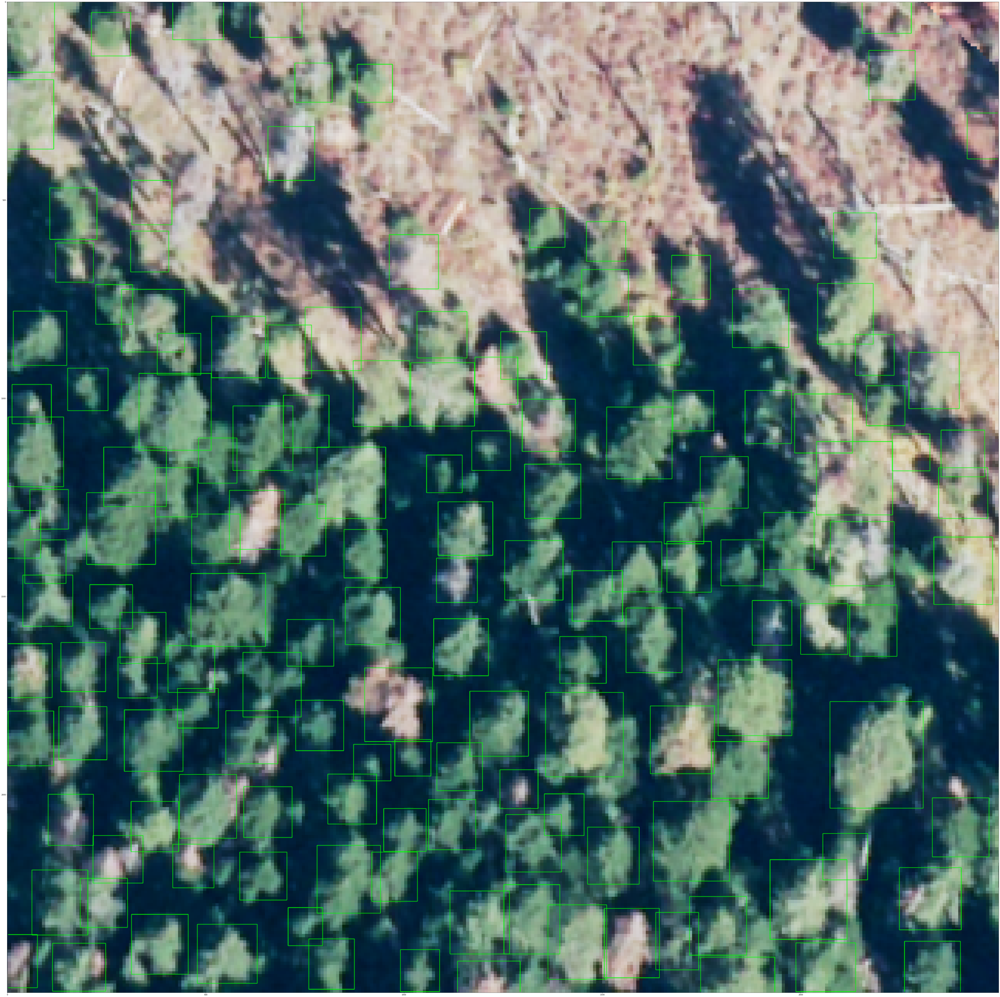

In [41]:
prediction = test_model.predict_image(raw_image = crop,return_plot=True, score_threshold=0.01,color=[0,255,0])
plt.figure(figsize=(100,100))
plt.imshow(prediction[...,::-1]) #show in rgb channel order

For large images, you often need to zoom to properly see the bounding boxes, they are only 1 pixel wide to not get in the way of the image.

3200 predictions in overlapping windows, applying non-max supression
2213 predictions kept after non-max suppression


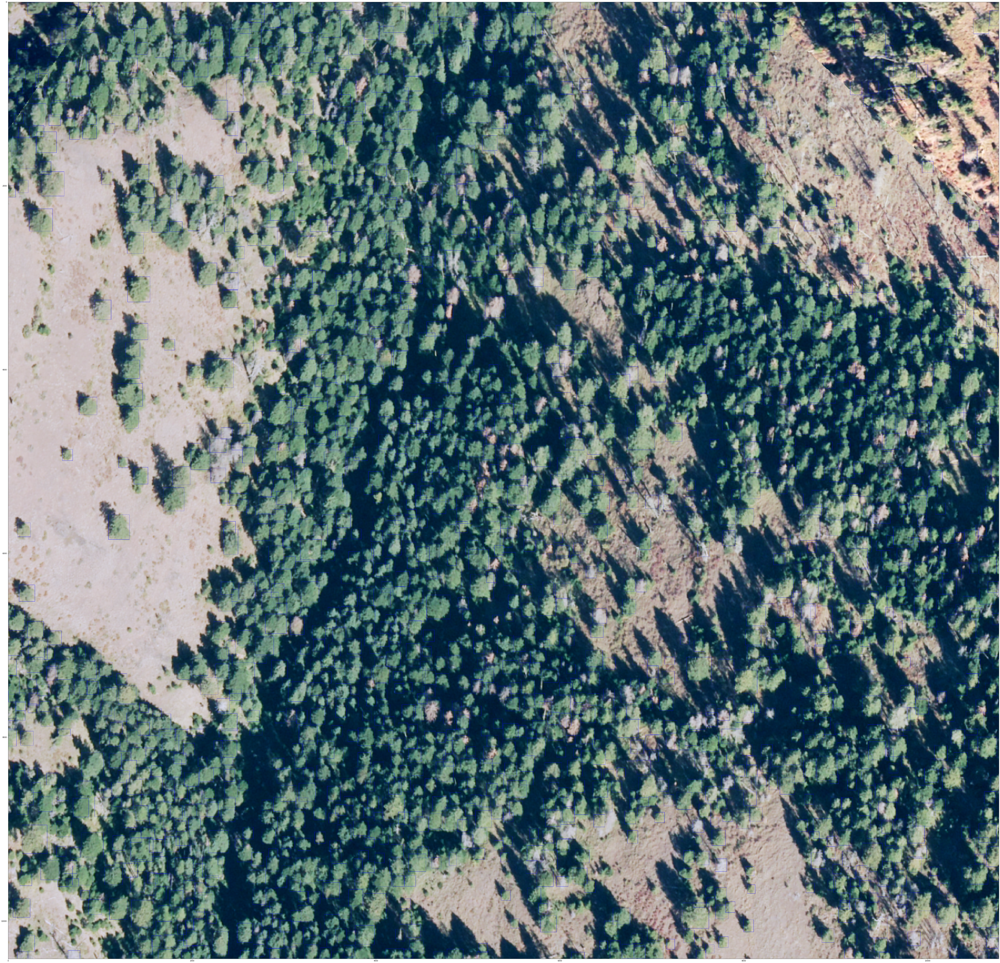

In [43]:
tile_prediction = test_model.predict_tile(path_to_raster=raster_path,return_plot = True,patch_size=2500,patch_overlap=0.05,iou_threshold=0.1)
plt.figure(figsize=(100,100))
plt.imshow(tile_prediction) 
plt.figsave()

In [46]:
cv2.imwrite("/Users/ben/Downloads/NAIP/East_ben_prediction.tif",tile_prediction[...,::-1])

True